In [1]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import scipy.io as sio

from PIL import Image
from skimage.util import img_as_float
from skimage.color import rgb2gray
from skimage.io import imread, imsave
from scipy.io import loadmat
from tqdm import tqdm

import cv2

In [2]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [7]:
data_dir = "/content/gdrive/MyDrive/CV/termProject/project_data/"

# Checking if our specified directory exists
os.path.exists(data_dir)

True

# Train data 불러오기

In [4]:
# train data 불러오는 class

class BoundaryDataset(object):
    """
    Project boundary dataset wrapper

    Given the path to the root of the dataset, this class provides
    methods for loading images and ground truths.

    Attributes:

    root_dir - the root path of the dataset
    data_path - the path of the data directory within the root
    sample_names - a list of names of images
    """
    def __init__(self, root_dir='.', split='train'):
        """
        Constructor

        :param root_dir: the path to the root of the custom dataset
        :param split: 'train' or 'test'
        """
        self.root_dir = root_dir
        self.data_path = os.path.join(root_dir, split)
        self.sample_names = self._sample_names(self.data_path)

    def __len__(self):
        """
        Get the number of samples in the dataset
        :return: the number of samples
        """
        return len(self.sample_names)

    @staticmethod
    def _sample_names(directory):
        names = []
        files = os.listdir(directory)
        for fn in files:
            name, ext = os.path.splitext(fn)
            if ext.lower() == '.jpg':
                names.append(name)
        return names

    def read_image(self, name):
        """
        Load the image identified by the sample name
        :param name: the sample name
        :return: a (H,W,3) array containing the image
        """
        path = os.path.join(self.data_path, f"{name}.jpg")
        return imread(path)

    def load_boundaries(self, name):
        """
        Load the boundaries identified by the sample name
        :param name: the sample name
        :return: a list of (H,W) arrays, each of which contains a boundary ground truth
        """
        boundary_path = os.path.join(self.data_path, f"{name}.npy")
        if os.path.exists(boundary_path):
            boundaries = np.load(boundary_path, allow_pickle=True)
            return list(boundaries)
        return []

In [8]:
num_images = 10
split = 'forppt'

# Load the dataset using BoundaryDataset class
dataset = BoundaryDataset(data_dir, split=split)

print(f"Data size: {len(dataset)}")

Data size: 5


# ground truth 함께 확인

In [ ]:
sorted(dataset.sample_names)[100:110]

['232038',
 '236017',
 '238011',
 '239007',
 '239096',
 '24004',
 '241004',
 '242078',
 '246016',
 '246053']

In [10]:
random.seed(100)
selected_sample_names = random.sample(dataset.sample_names, min(num_images, len(dataset.sample_names)))
selected_sample_names = sorted(dataset.sample_names)[100:110]

# Plot multiple images and their boundaries
for selected_sample_name in dataset.sample_names:
    print(f"Processing image: {split}/{selected_sample_name}")
    image = dataset.read_image(selected_sample_name)
    boundaries = dataset.load_boundaries(selected_sample_name)

    fig, ax = plt.subplots(1, len(boundaries) + 1, figsize=(6 * (len(boundaries) + 1), 6))

    ax[0].imshow(image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    for i in range(len(boundaries)):
        ax[i + 1].imshow(boundaries[i], cmap='gray')
        ax[i + 1].set_title(f"Boundary {i + 1}")
        ax[i + 1].axis("off")

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# Canny Edge detector + adaptive_threshold

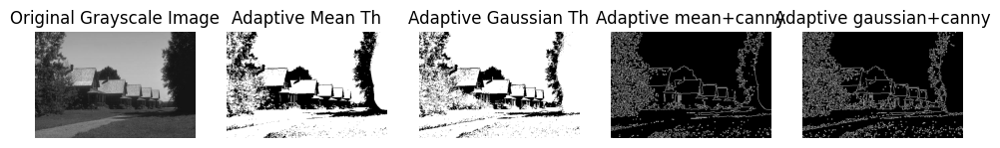

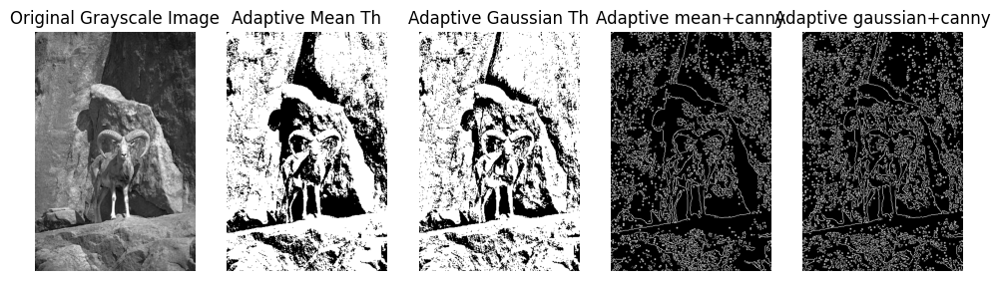

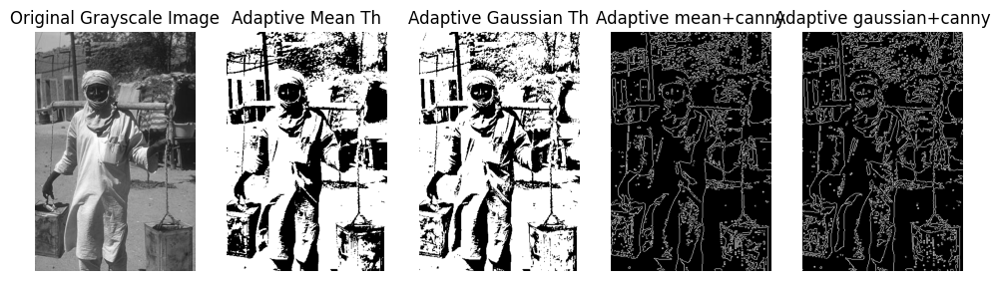

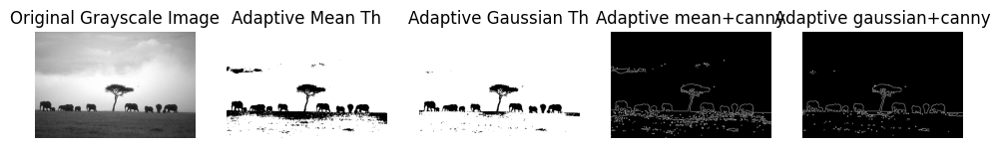

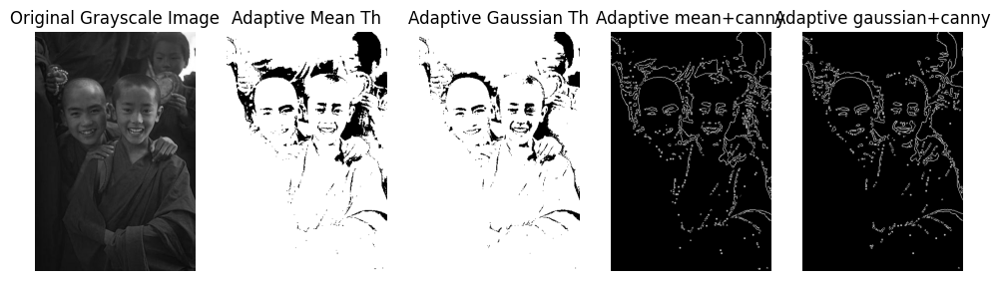

In [17]:
for selected_sample_name in dataset.sample_names:


  img = dataset.read_image(selected_sample_name)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  # Apply Adaptive Mean Thresholding
  adaptive_thresh_mean = cv2.adaptiveThreshold(
      img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 101, 17)

  # Apply Adaptive Gaussian Thresholding
  adaptive_thresh_gaussian = cv2.adaptiveThreshold(
      img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 101, 17)


  # Apply Canny Edge Detection
  canny_edge_m = cv2.Canny(adaptive_thresh_mean, threshold1=30, threshold2=100)
  canny_edge_g = cv2.Canny(adaptive_thresh_gaussian, threshold1=30, threshold2=100)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 5, 1)
  plt.title('Original Grayscale Image')
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.title('Adaptive Mean Th')
  plt.imshow(adaptive_thresh_mean, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.title('Adaptive Gaussian Th')
  plt.imshow(adaptive_thresh_gaussian, cmap='gray')
  plt.axis('off')


  # Display the Canny edge detection result
  plt.subplot(1, 5, 4)
  plt.title('Adaptive mean+canny')
  plt.imshow(canny_edge_m, cmap='gray')
  plt.axis('off')

  # Display the Canny edge detection result
  plt.subplot(1, 5, 5)
  plt.title('Adaptive gaussian+canny')
  plt.imshow(canny_edge_g, cmap='gray')
  plt.axis('off')

  plt.show()



# Otsu

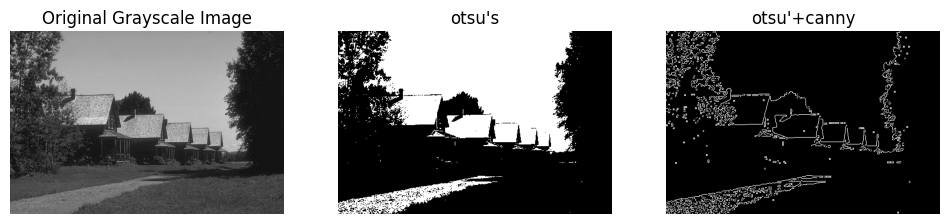

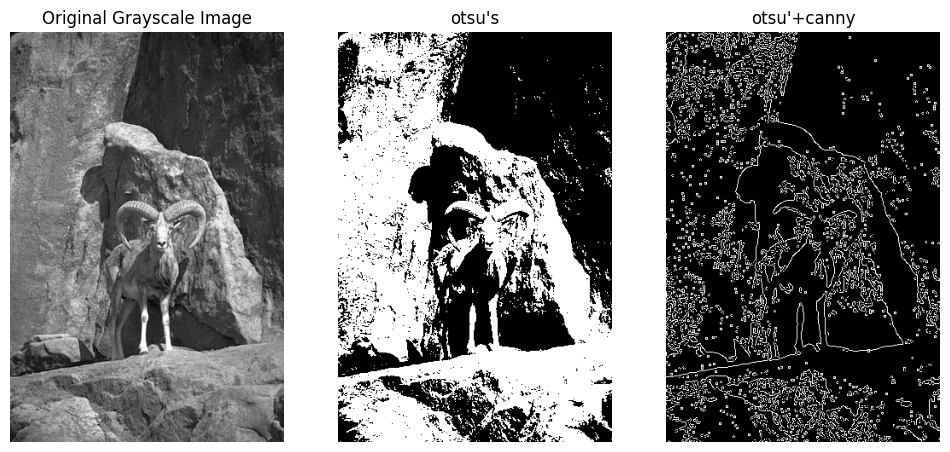

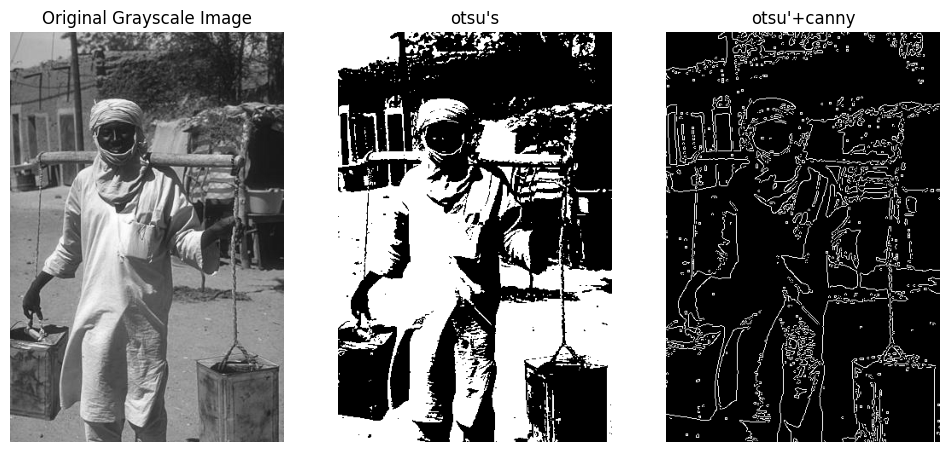

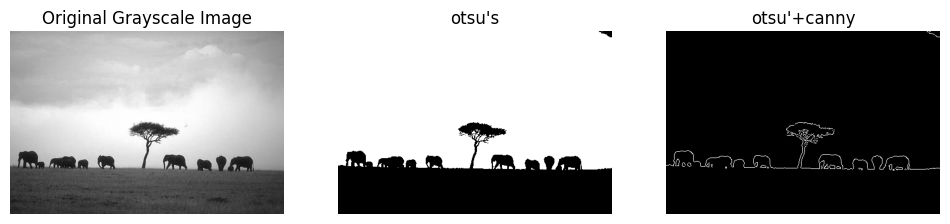

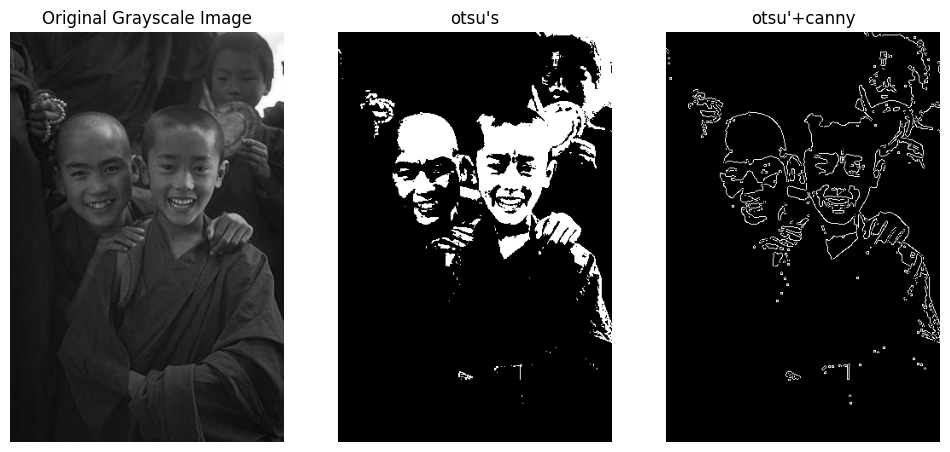

In [22]:
for selected_sample_name in dataset.sample_names:


  img = dataset.read_image(selected_sample_name)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  otsu_threshold_value, otsu_thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(otsu_thresh, threshold1=30, threshold2=100)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 3, 1)
  plt.title('Original Grayscale Image')
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.title('otsu\'s')
  plt.imshow(otsu_thresh, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.title('otsu\'+canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')


  # Display the Canny edge detection result
  # plt.subplot(1, 5, 4)
  # plt.title('Adaptive mean+canny')
  # plt.imshow(canny_edge, cmap='gray')
  # plt.axis('off')

  # # Display the Canny edge detection result
  # plt.subplot(1, 5, 5)
  # plt.title('Adaptive gaussian+canny')
  # plt.imshow(canny_edge_g, cmap='gray')
  # plt.axis('off')

  plt.show()



In [ ]:
C

# **Contour Detection** + Adaptive Thre

contours : 윤곽선의 지점

hierarchy : contours에 해당하는 속성들

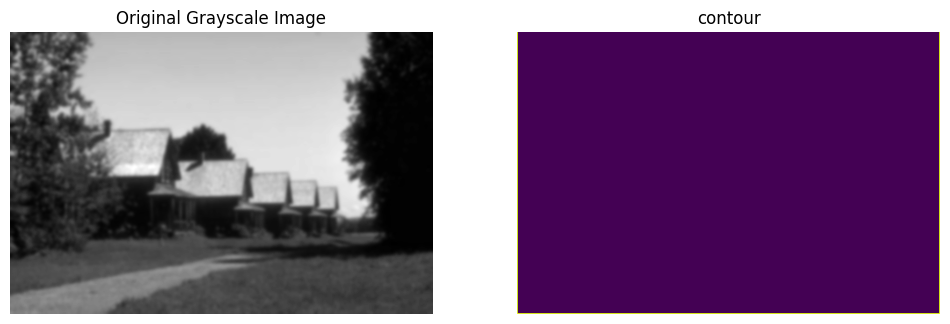

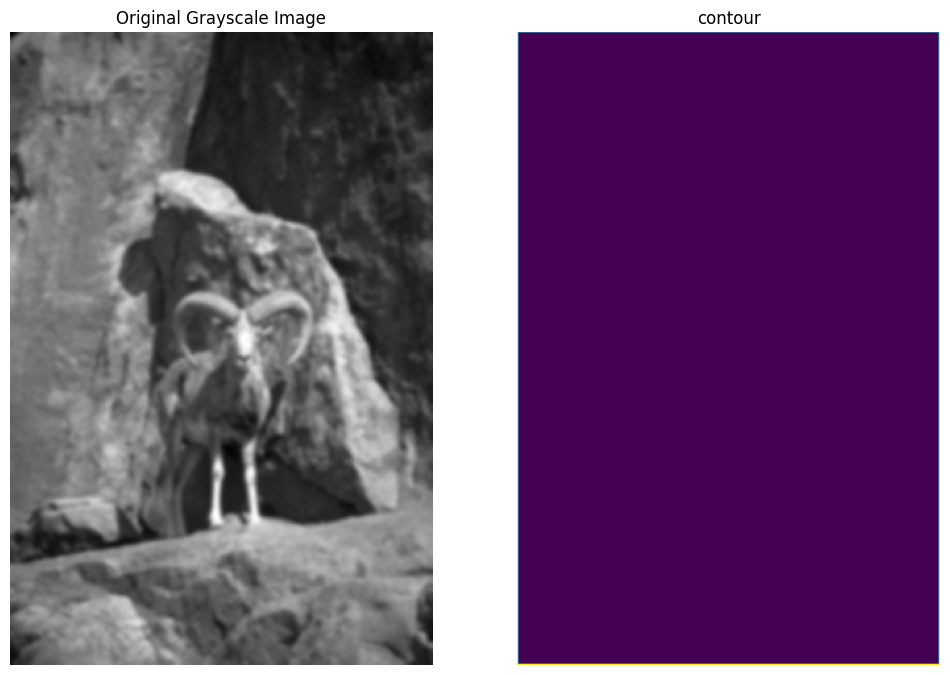

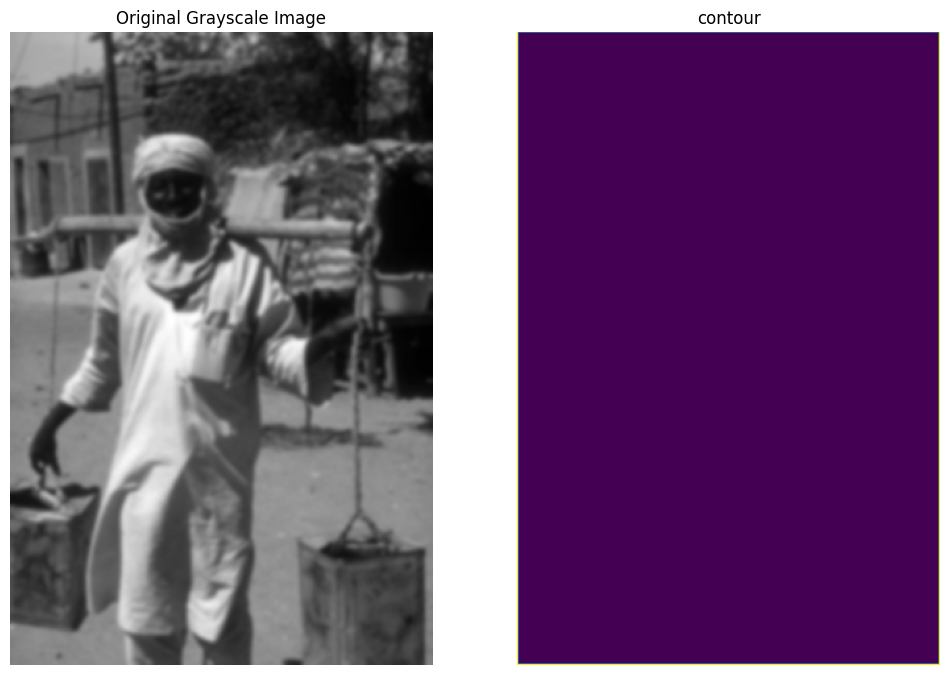

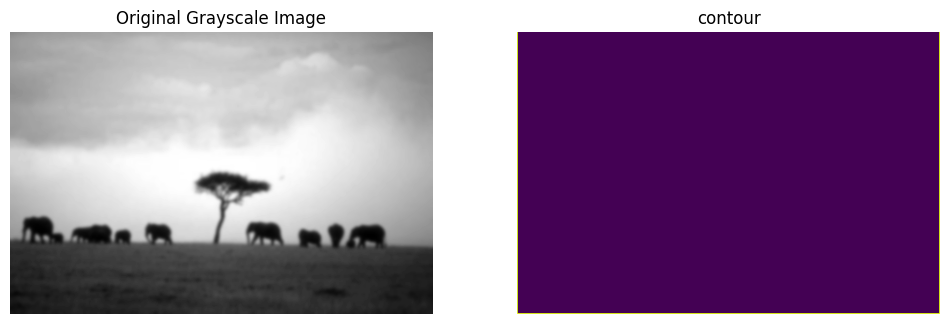

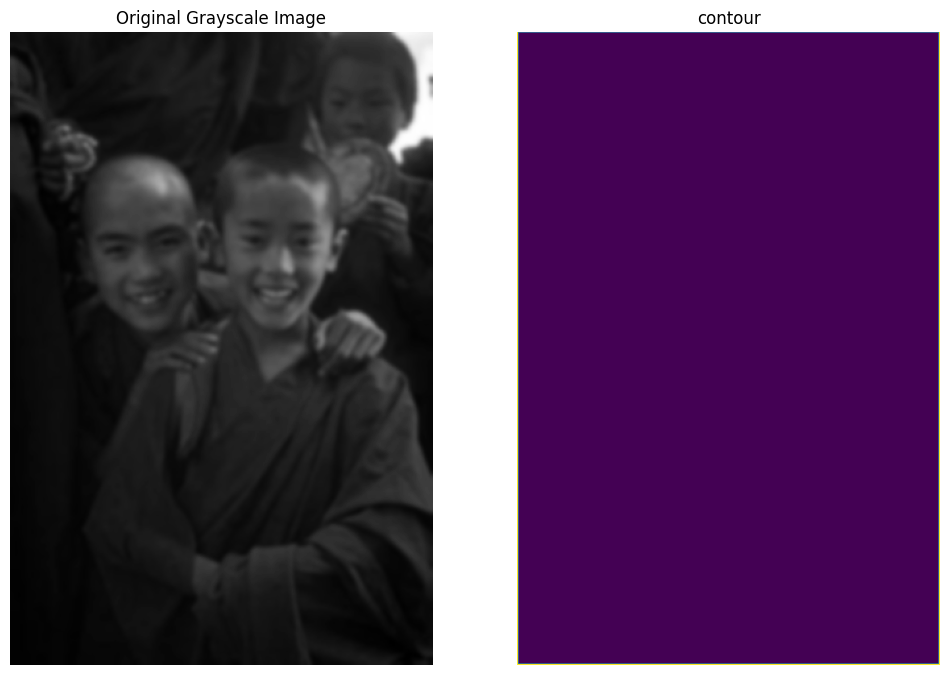

In [53]:
for selected_sample_name in dataset.sample_names:


  img = dataset.read_image(selected_sample_name)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  # Apply Adaptive Mean Thresholding
  # adaptive_thresh_mean = cv2.adaptiveThreshold(
  #     img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 401, 17)

  # # Apply Adaptive Gaussian Thresholding
  # adaptive_thresh_gaussian = cv2.adaptiveThreshold(
  #     img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 401, 17)

  gblur_img  = cv2.GaussianBlur(img, (9,9), sigmaX = 0, sigmaY = 0)


  # black image
  black = np.zeros(img.shape, np.uint8)


  # Apply Canny Edge Detection
  contours, _ = cv2.findContours(gblur_img, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
  cv2.drawContours(black, contours, -1, (255, 255, 255), 1)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 2, 1)
  plt.title('Original Grayscale Image')
  plt.imshow(gblur_img, cmap='gray')
  plt.axis('off')

  # plt.subplot(1, 4, 2)
  # plt.title('Adaptive Mean Thre')
  # plt.imshow(adaptive_thresh_mean, cmap='gray')
  # plt.axis('off')

  # plt.subplot(1, 4, 3)
  # plt.title('Adaptive Gaussian Thre')
  # plt.imshow(adaptive_thresh_gaussian, cmap='gray')
  # plt.axis('off')


  # Display the contour detection result
  plt.subplot(1, 2, 2)
  plt.title('contour')
  plt.imshow(black)
  plt.axis('off')

  plt.show()



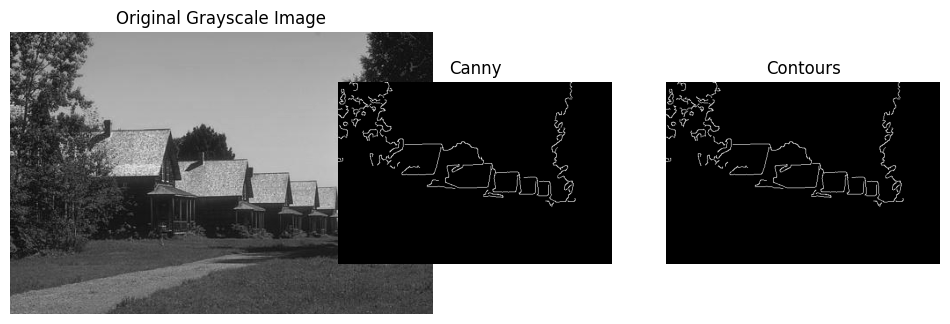

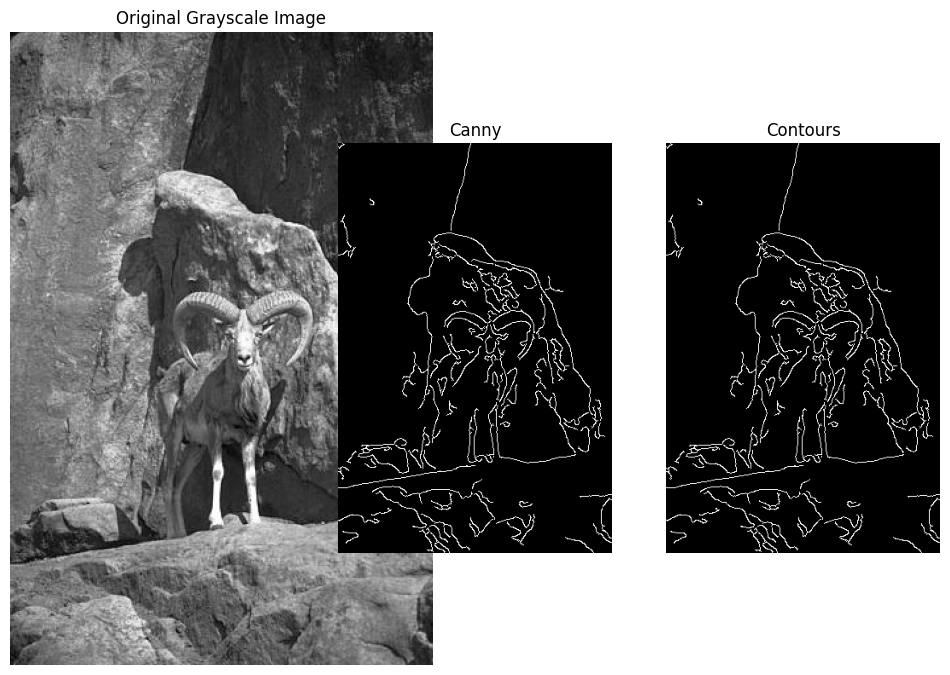

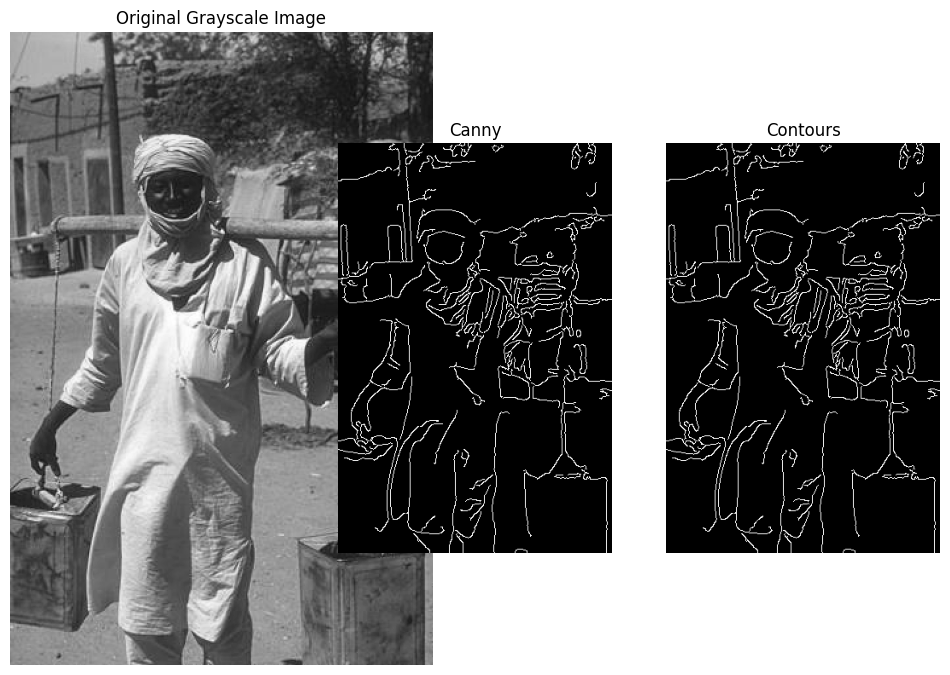

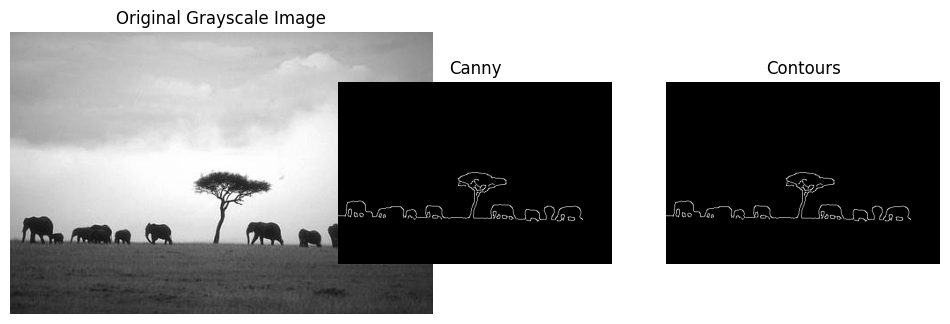

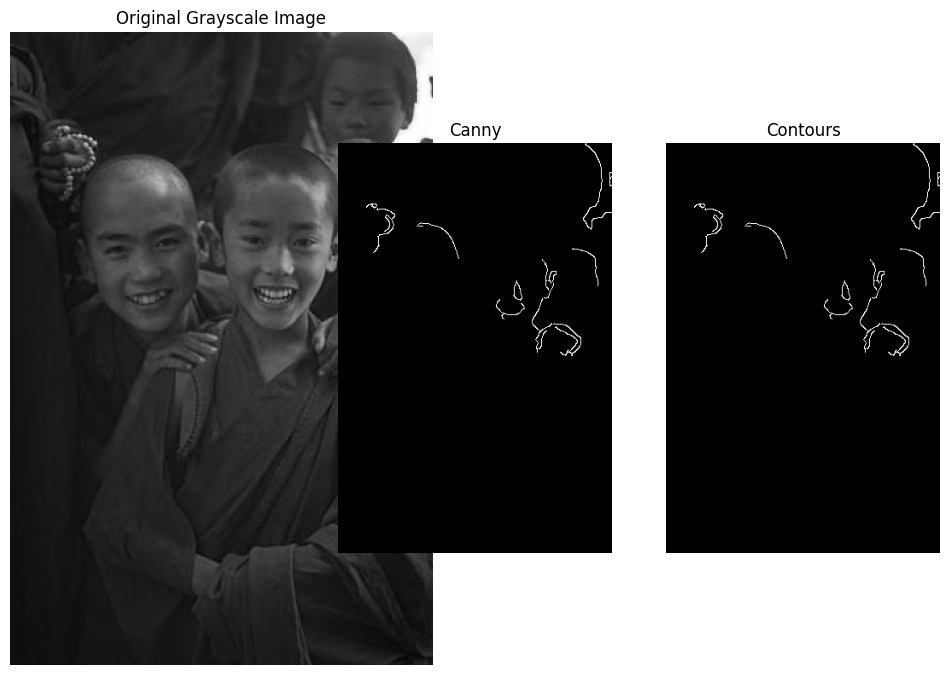

In [60]:
for selected_sample_name in dataset.sample_names:

    # 이미지 읽기 및 그레이스케일 변환
    img = dataset.read_image(selected_sample_name)
    img = np.array(img, dtype=np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Gaussian Blur 적용
    gblur_img = cv2.GaussianBlur(img, (9, 9), sigmaX=0, sigmaY=0)

    # Canny Edge Detection 적용
    edges = cv2.Canny(gblur_img, threshold1=50, threshold2=150)

    # 검은 이미지 생성
    black = np.zeros(img.shape, np.uint8)

    # 윤곽선 찾기
    contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
    cv2.drawContours(black, contours, -1, (255, 0, 255), 1)

    # 결과 시각화
    plt.figure(figsize=(12, 9))
    plt.subplot(1, 2, 1)
    plt.title('Original Grayscale Image')
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Canny')
    plt.imshow(edges, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Contours')
    plt.imshow(black, cmap='gray')
    plt.axis('off')

    plt.show()

In [ ]:
x

# 먼저 gaussian 적용 후, AT 하기

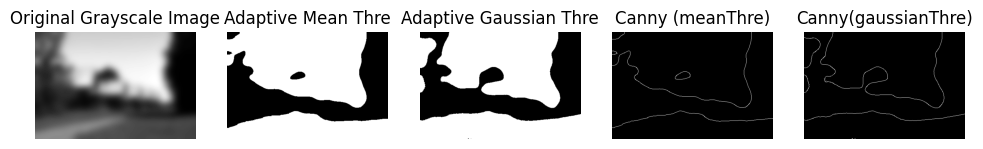

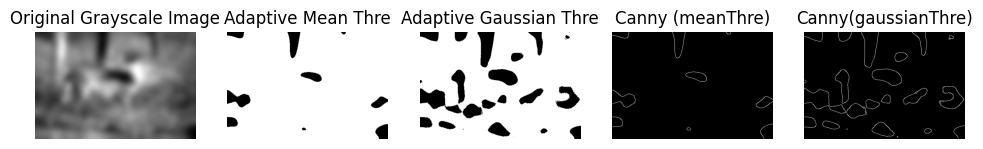

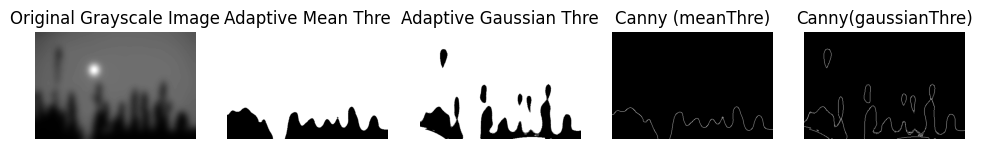

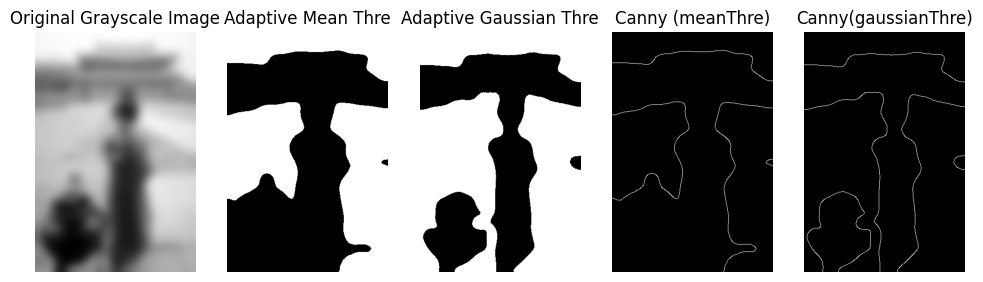

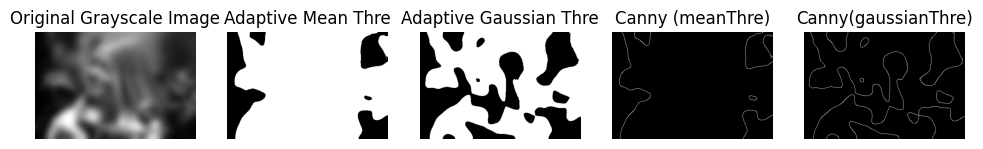

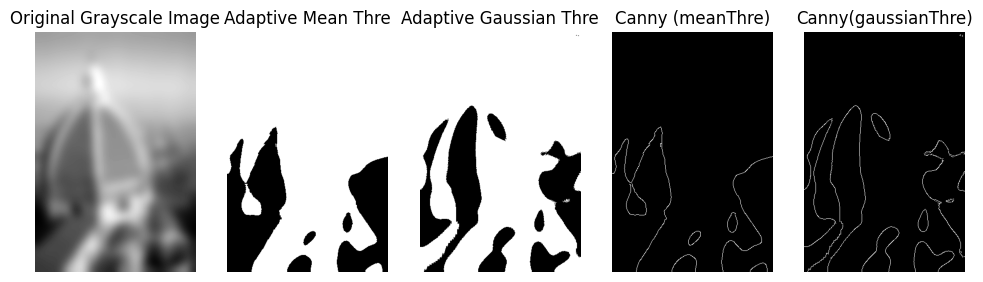

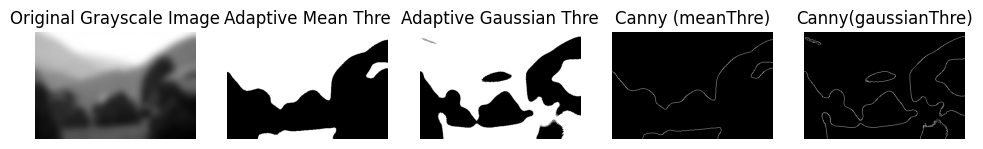

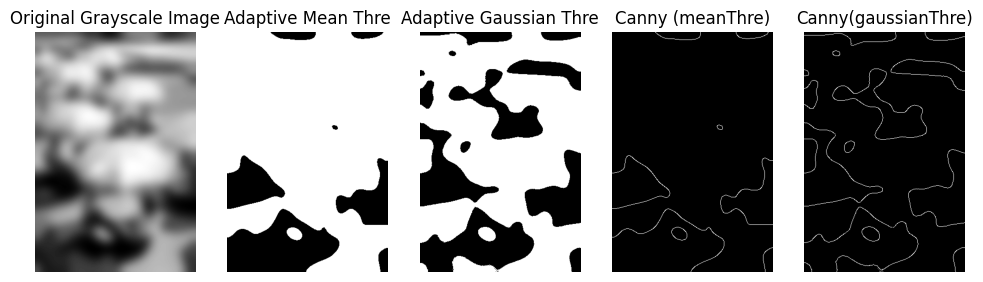

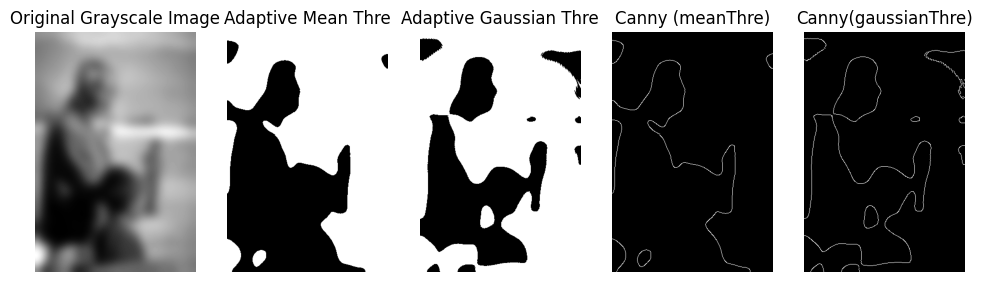

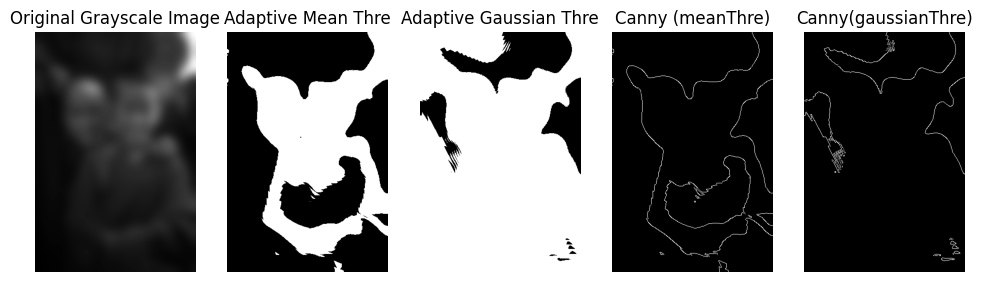

In [ ]:
for selected_sample_name in selected_sample_names:


  img = dataset.read_image(selected_sample_name)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  # 블러링
  gblur_img  = cv2.GaussianBlur(img, (65, 65), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(img, ksize=17)


  # Apply Adaptive Mean Thresholding
  adaptive_thresh_mean = cv2.adaptiveThreshold(
      gblur_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 1111, 10)

  # Apply Adaptive Gaussian Thresholding
  adaptive_thresh_gaussian = cv2.adaptiveThreshold(
      gblur_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 399, 10)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(adaptive_thresh_mean, threshold1=0, threshold2=255)

  canny_edge_gaussian = cv2.Canny(adaptive_thresh_gaussian, threshold1=0, threshold2=255)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 5, 1)
  plt.title('Original Grayscale Image')
  plt.imshow(gblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.title('Adaptive Mean Thre')
  plt.imshow(adaptive_thresh_mean, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.title('Adaptive Gaussian Thre')
  plt.imshow(adaptive_thresh_gaussian, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.title('Canny (meanThre)')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')


  # Display the Canny edge detection result
  plt.subplot(1, 5, 5)
  plt.title('Canny(gaussianThre)')
  plt.imshow(canny_edge_gaussian, cmap='gray')
  plt.axis('off')

  plt.show()



# inverse 적용

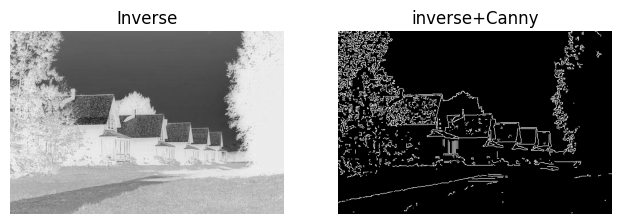

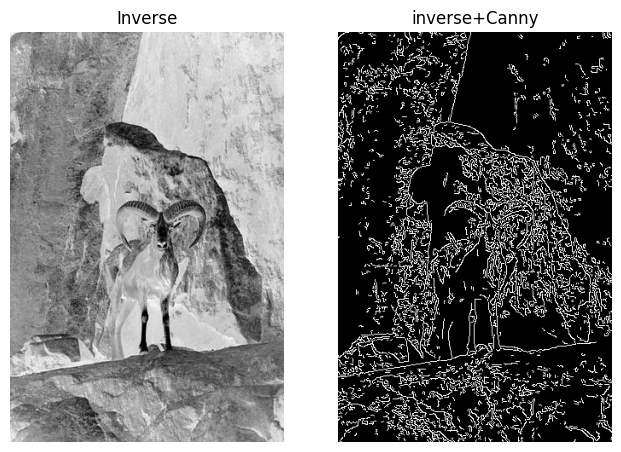

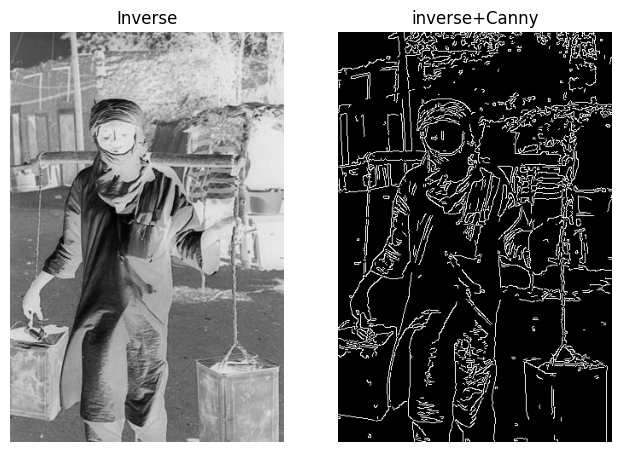

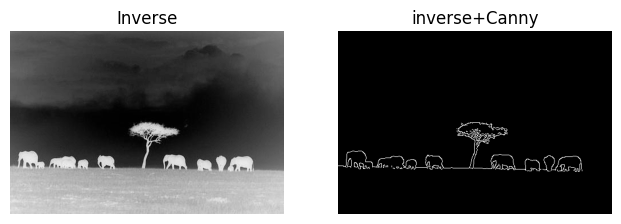

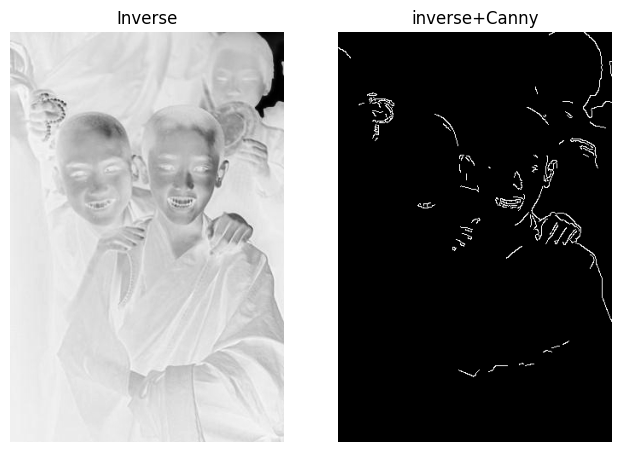

In [47]:
for selected_sample_name in dataset.sample_names:


  img = dataset.read_image(selected_sample_name)
  # inverse
  img = cv2.bitwise_not(img)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  # 블러링
  gblur_img  = cv2.GaussianBlur(img, (9,9), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(img, ksize=17)


  # # Apply Adaptive Mean Thresholding
  # adaptive_thresh_mean = cv2.adaptiveThreshold(
  #     mblur_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 799, 5)

  # # Apply Adaptive Gaussian Thresholding
  # adaptive_thresh_gaussian = cv2.adaptiveThreshold(
  #     mblur_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 699, 5)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(img, threshold1=150, threshold2=230)

  canny_edge_gaussian = cv2.Canny(adaptive_thresh_gaussian, threshold1=0, threshold2=255)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 3, 1)
  plt.title('Inverse')
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  # plt.subplot(1, 3, 2)
  # plt.title('gaussian blur')
  # plt.imshow(gblur_img, cmap='gray')
  # plt.axis('off')

  # plt.subplot(1, 5, 3)
  # plt.title('Adaptive Gaussian Thre')
  # plt.imshow(adaptive_thresh_gaussian, cmap='gray')
  # plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.title('inverse+Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')


  # Display the Canny edge detection result
  # plt.subplot(1, 5, 5)
  # plt.title('Canny(gaussianThre)')
  # plt.imshow(canny_edge_gaussian, cmap='gray')
  # plt.axis('off')

  plt.show()



# hitogram Equal

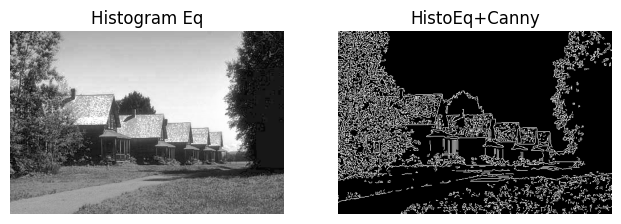

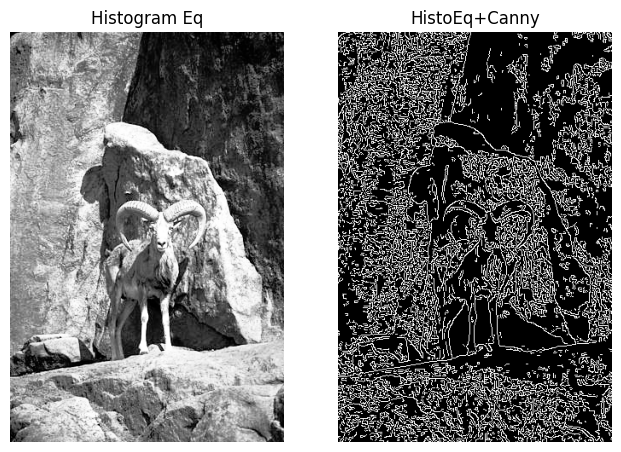

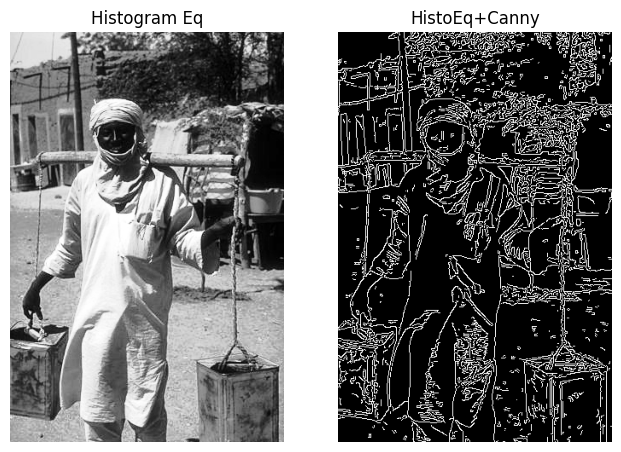

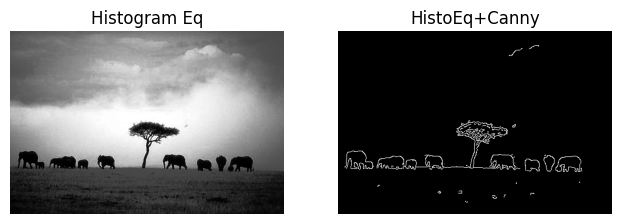

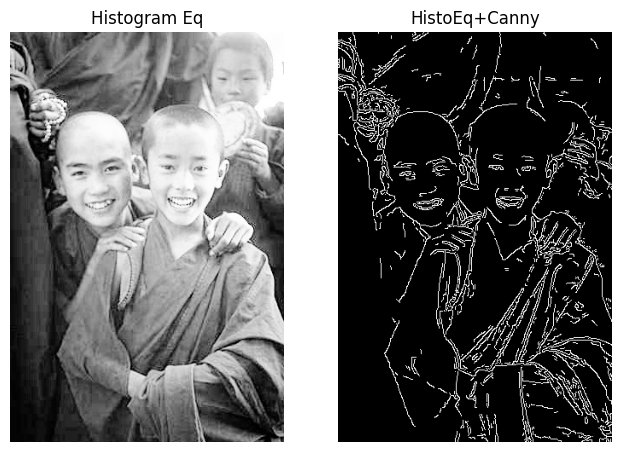

In [48]:
for selected_sample_name in dataset.sample_names:


  img = dataset.read_image(selected_sample_name)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img =  cv2.equalizeHist(img)


  # 블러링
  gblur_img  = cv2.GaussianBlur(img, (9,9), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(img, ksize=17)


  # # Apply Adaptive Mean Thresholding
  # adaptive_thresh_mean = cv2.adaptiveThreshold(
  #     mblur_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 799, 5)

  # # Apply Adaptive Gaussian Thresholding
  # adaptive_thresh_gaussian = cv2.adaptiveThreshold(
  #     mblur_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 699, 5)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(img, threshold1=150, threshold2=230)

  canny_edge_gaussian = cv2.Canny(adaptive_thresh_gaussian, threshold1=0, threshold2=255)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 3, 1)
  plt.title('Histogram Eq')
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  # plt.subplot(1, 3, 2)
  # plt.title('gaussian blur')
  # plt.imshow(gblur_img, cmap='gray')
  # plt.axis('off')

  # plt.subplot(1, 5, 3)
  # plt.title('Adaptive Gaussian Thre')
  # plt.imshow(adaptive_thresh_gaussian, cmap='gray')
  # plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.title('HistoEq+Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')


  # Display the Canny edge detection result
  # plt.subplot(1, 5, 5)
  # plt.title('Canny(gaussianThre)')
  # plt.imshow(canny_edge_gaussian, cmap='gray')
  # plt.axis('off')

  plt.show()



## ⭐️⭐️blend (
1. gray + gaussian blur
2. gray + median blur +  adaptive_thresh_gaussian )


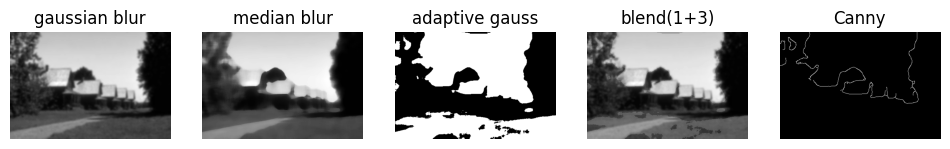

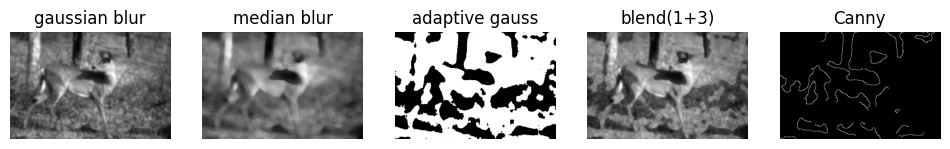

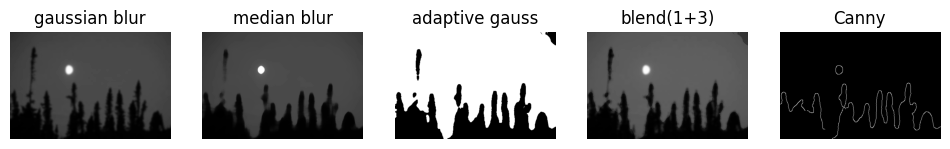

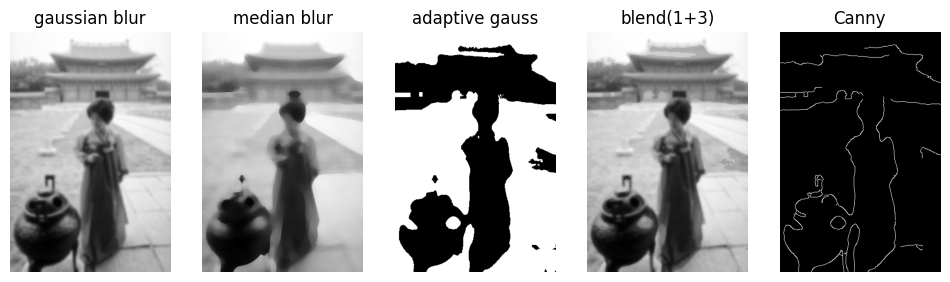

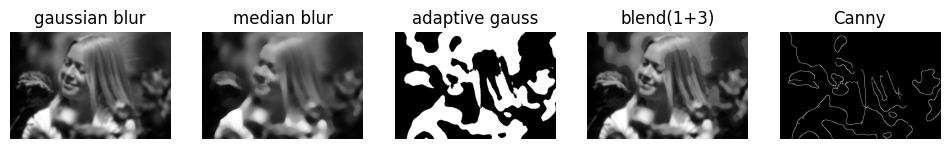

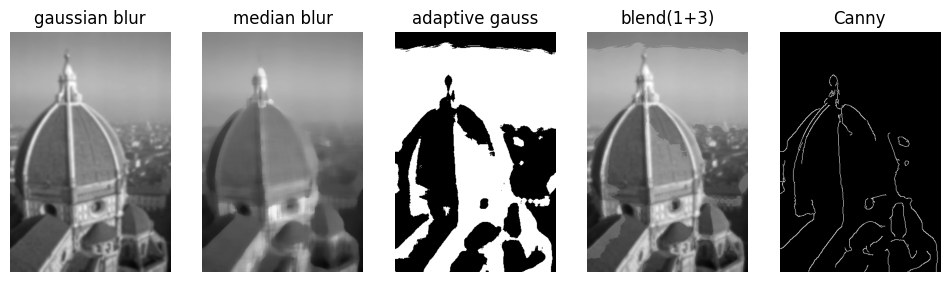

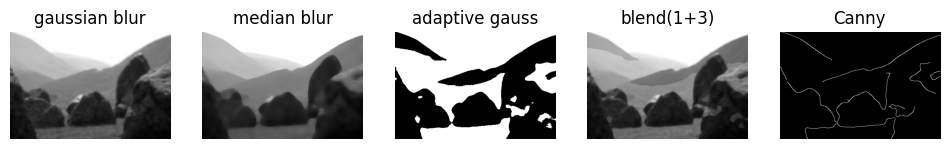

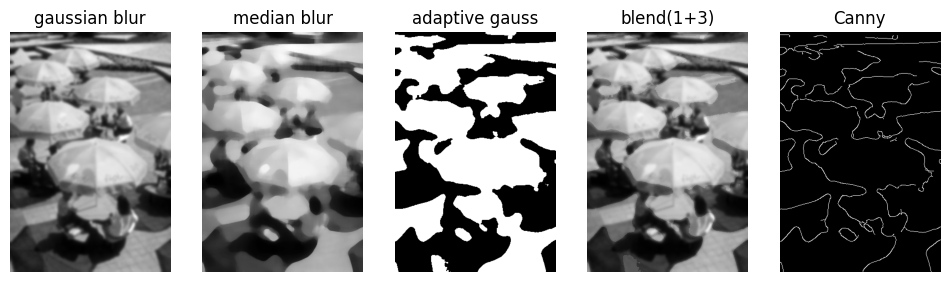

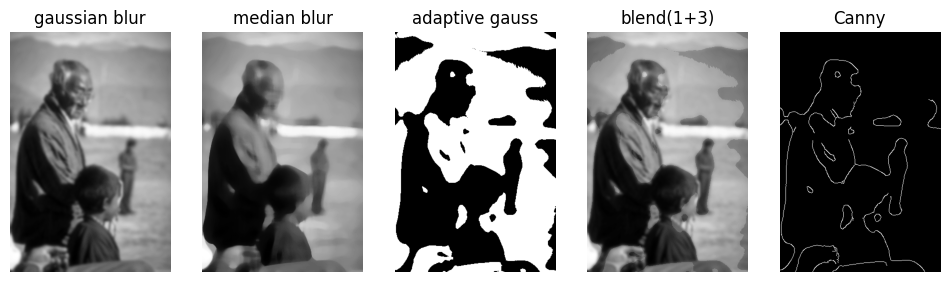

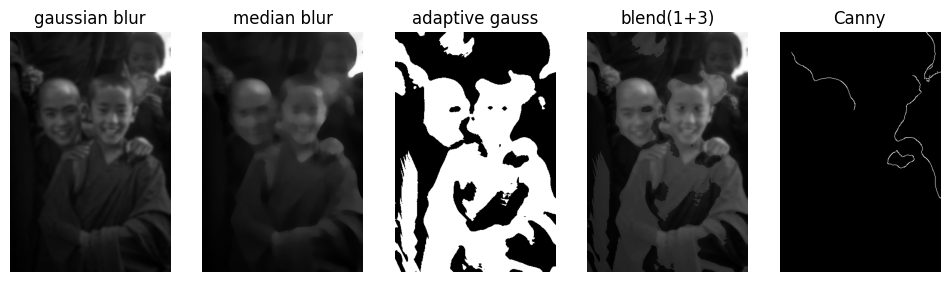

In [ ]:
for selected_sample_name in selected_sample_names:


  image = dataset.read_image(selected_sample_name)
  # histogram normalize
  image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
  image = np.array(image)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


  # 블러링
  gblur_img  = cv2.GaussianBlur(image, (13, 13), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(image, ksize=17)


  # # Apply Adaptive Mean Thresholding
  # adaptive_thresh_mean = cv2.adaptiveThreshold(
  #     mblur_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 699, 5)

  # Apply Adaptive Gaussian Thresholding
  adaptive_thresh_gaussian = cv2.adaptiveThreshold(
      mblur_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 401, 3)


  # inverse + median blur + adaptive gaussian
  alpha = 0.1
  blend = cv2.addWeighted(gblur_img, 1-alpha, adaptive_thresh_gaussian, alpha, 0)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(blend, threshold1=100, threshold2=230)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 5, 1)
  plt.title('gaussian blur')
  plt.imshow(gblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.title('adaptive gauss')
  plt.imshow(adaptive_thresh_gaussian, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.title('median blur')
  plt.imshow(mblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.title('blend(1+3)')
  plt.imshow(blend, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 5)
  plt.title('Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')

  plt.show()



## blend (
1. gray + gaussian blur
2. gray + median blur +  adaptive_thresh_MEAN )


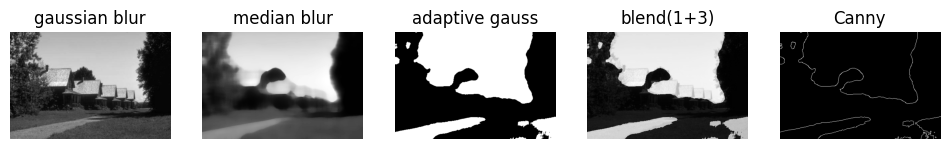

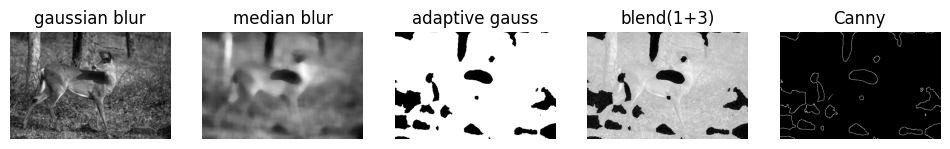

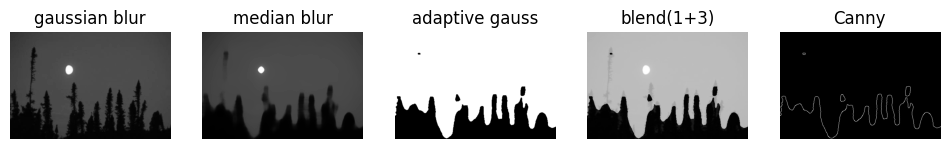

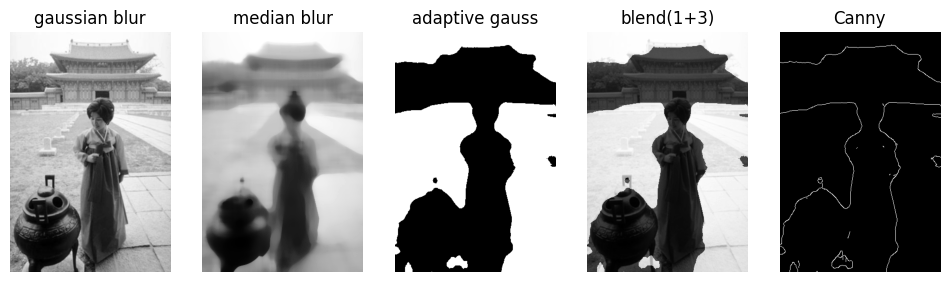

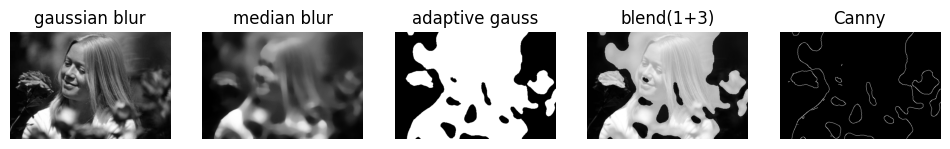

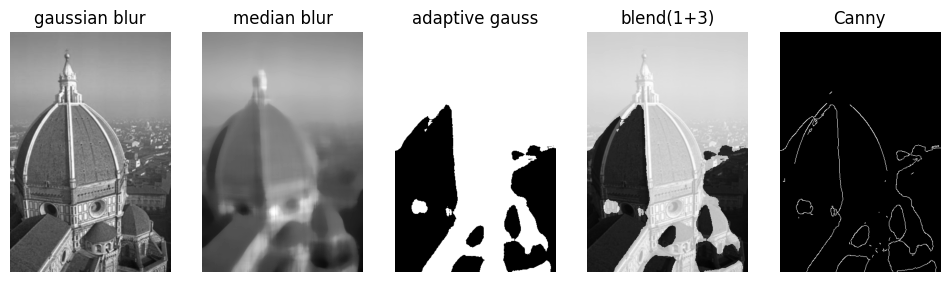

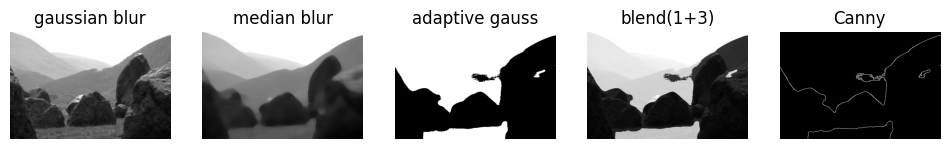

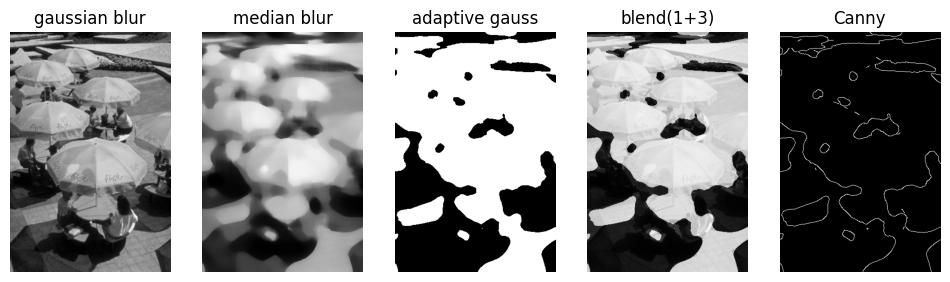

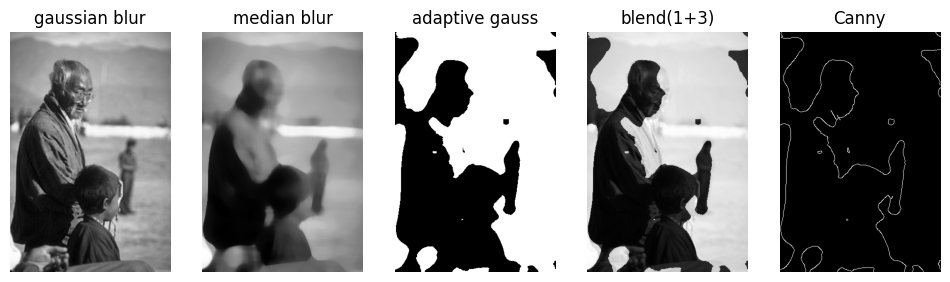

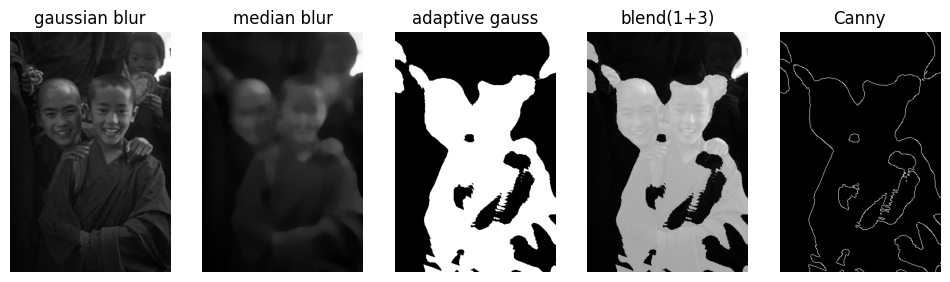

In [ ]:
for selected_sample_name in selected_sample_names:


  image = dataset.read_image(selected_sample_name)
  # histogram normalize
  image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
  image = np.array(image)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


  # 블러링
  gblur_img  = cv2.GaussianBlur(image, (3, 3), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(image, ksize=23)


  # # Apply Adaptive Mean Thresholding
  adaptive_thresh_mean = cv2.adaptiveThreshold(
      mblur_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 699, 5)

  # # Apply Adaptive Gaussian Thresholding
  # adaptive_thresh_gaussian = cv2.adaptiveThreshold(
  #     mblur_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 999, 3)


  # inverse + median blur + adaptive gaussian
  alpha = 0.6
  blend = cv2.addWeighted(gblur_img, 1-alpha, adaptive_thresh_mean, alpha, 0)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(blend, threshold1=200, threshold2=255)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 5, 1)
  plt.title('gaussian blur')
  plt.imshow(gblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.title('adaptive gauss')
  plt.imshow(adaptive_thresh_mean, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.title('median blur')
  plt.imshow(mblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.title('blend(1+3)')
  plt.imshow(blend, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 5)
  plt.title('Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')

  plt.show()



## blend (
1. gray
2. gray + gaussan blur +  adaptive_thresh_gaussian )

어우 얘는 진짜 아님

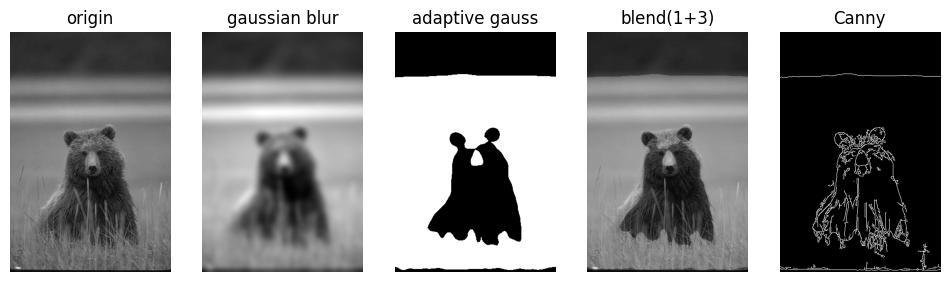

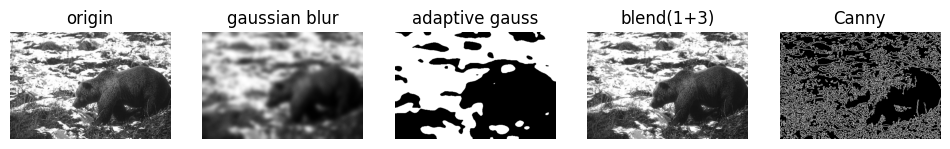

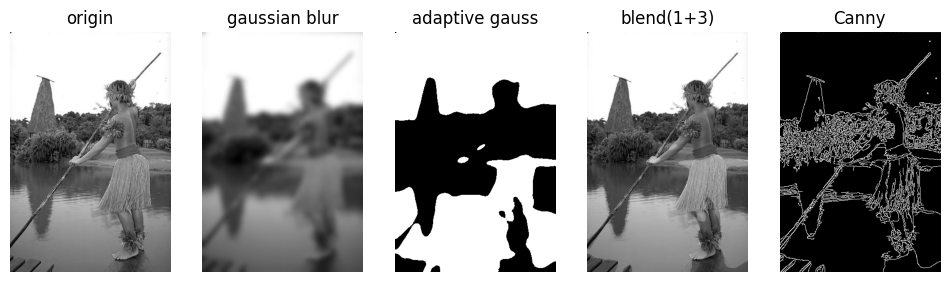

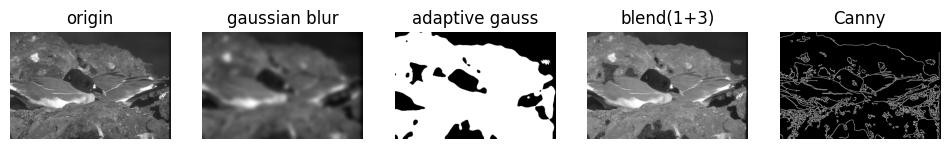

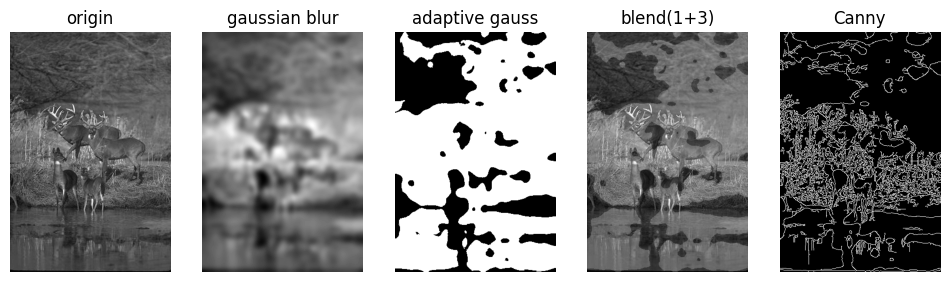

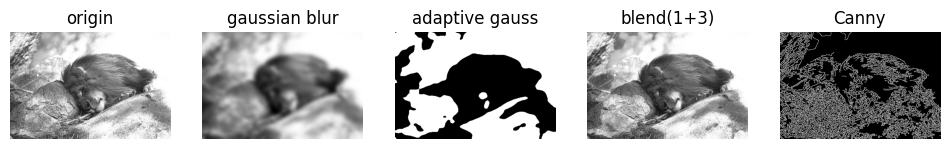

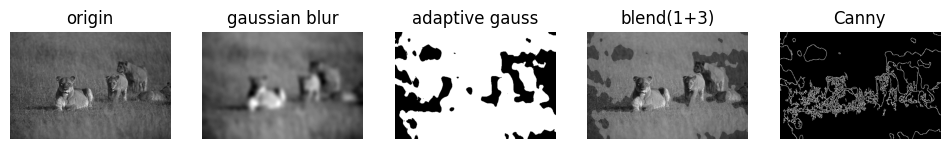

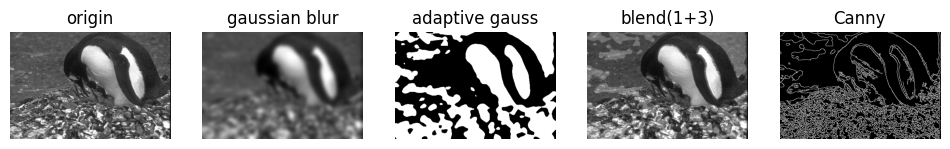

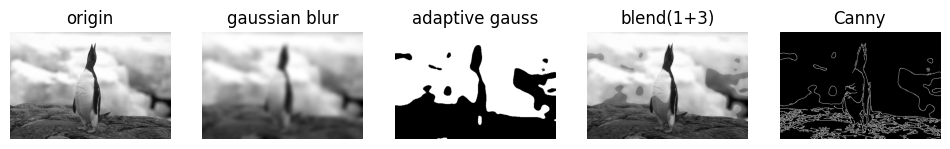

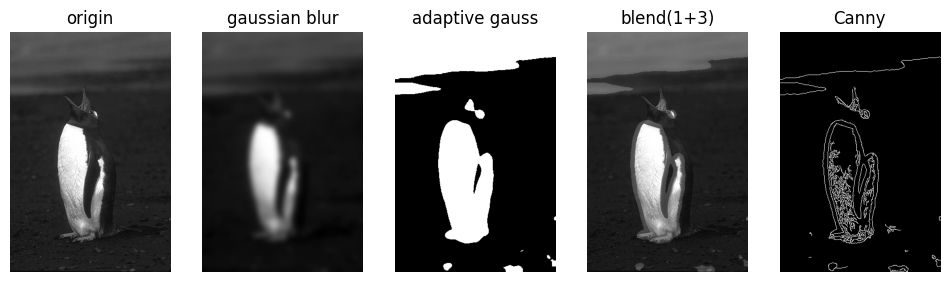

In [ ]:
for selected_sample_name in selected_sample_names:


  image = dataset.read_image(selected_sample_name)
  image = np.array(image)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  # inverse
  img = dataset.read_image(selected_sample_name)
  img = cv2.bitwise_not(img)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  # 블러링
  blur_img  = cv2.blur(image, (9, 9))
  gblur_img  = cv2.GaussianBlur(image, (33, 33), sigmaX = 0, sigmaY = 0)
  # mblur_img  = cv2.medianBlur(image, ksize=25)


  # Apply Adaptive Mean Thresholding
  # adaptive_thresh_mean = cv2.adaptiveThreshold(
  #     gblur_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 699, 5)

  # Apply Adaptive Gaussian Thresholding
  adaptive_thresh_gaussian = cv2.adaptiveThreshold(
      gblur_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 999, 3)


  # inverse + median blur + adaptive gaussian
  alpha = 0.15
  blend = cv2.addWeighted(image, 1-alpha, adaptive_thresh_gaussian, alpha, 0)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(blend, threshold1=50, threshold2=200)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 5, 1)
  plt.title('origin')
  plt.imshow(image, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.title('adaptive gauss')
  plt.imshow(adaptive_thresh_gaussian, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.title('gaussian blur')
  plt.imshow(gblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.title('blend(1+3)')
  plt.imshow(blend, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 5)
  plt.title('Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')

  plt.show()



## ⭐️⭐️gaussian blur + median blur

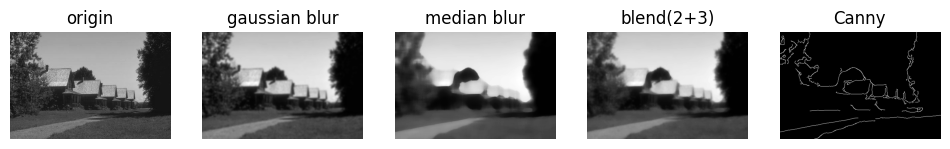

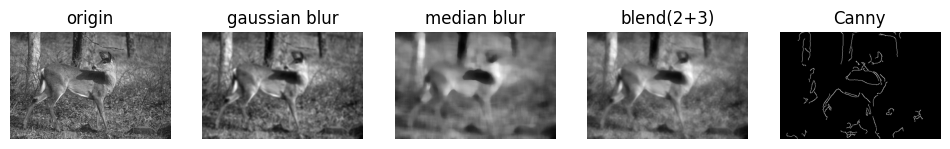

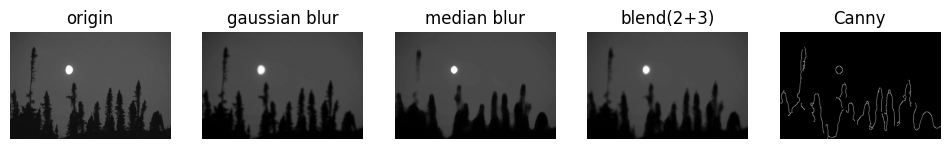

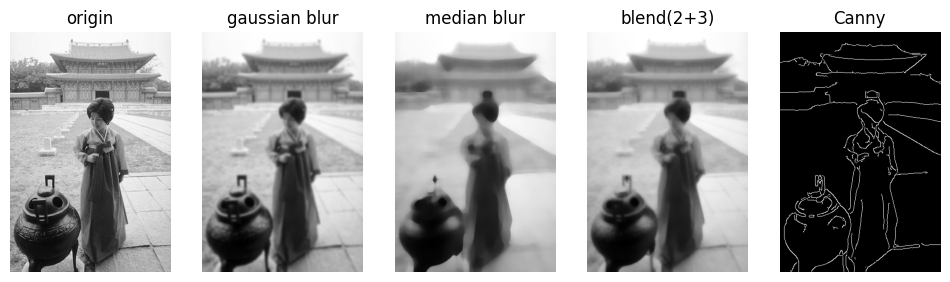

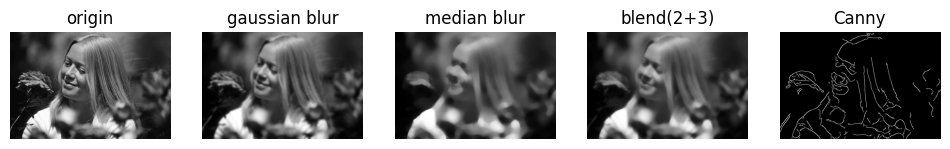

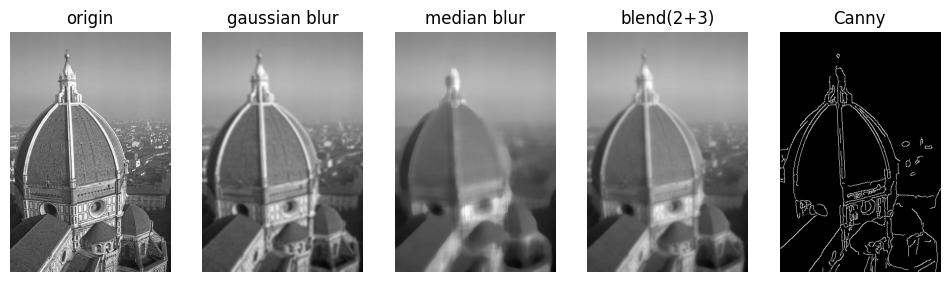

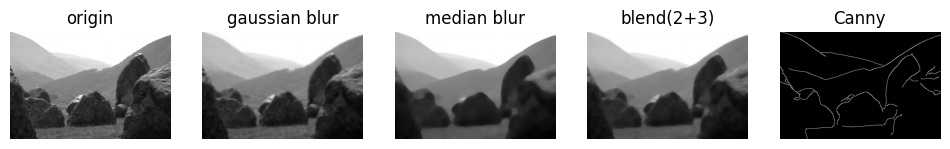

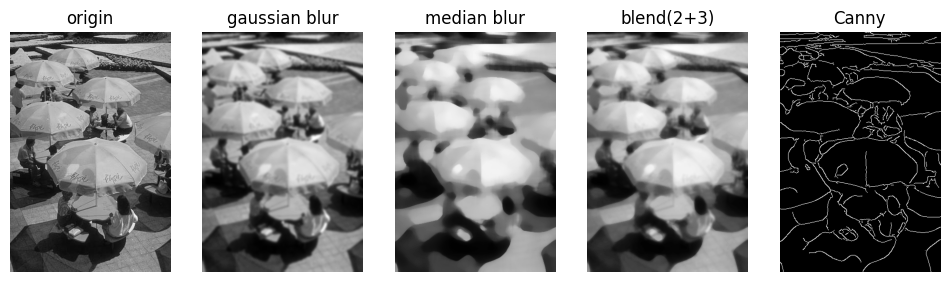

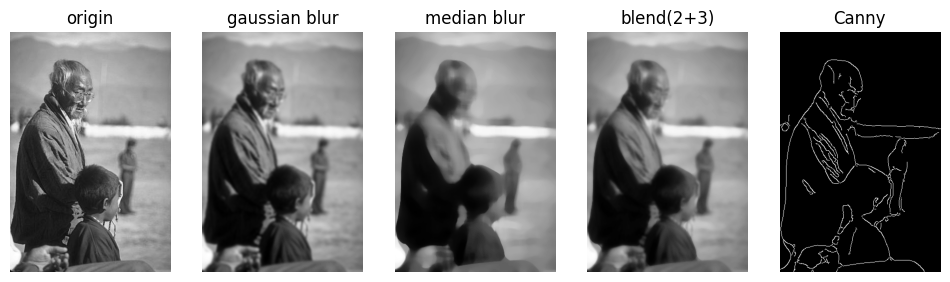

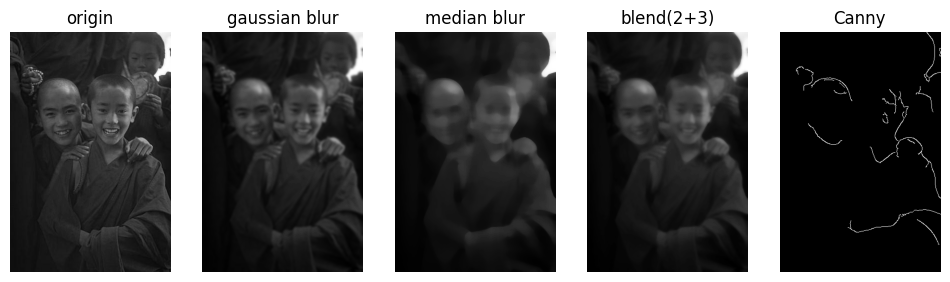

In [ ]:
for selected_sample_name in selected_sample_names:


  image = dataset.read_image(selected_sample_name)
  image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
  image = np.array(image)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # 블러링
  gblur_img  = cv2.GaussianBlur(image, (11, 11), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(image, ksize=19)

  # median blur + adaptive gaussian
  alpha = 0.5
  blend = cv2.addWeighted(gblur_img, 1-alpha, mblur_img, alpha, 0)

  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(blend, threshold1=3, threshold2=80)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 5, 1)
  plt.title('origin')
  plt.imshow(image, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.title('gaussian blur')
  plt.imshow(gblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.title('median blur')
  plt.imshow(mblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.title('blend(2+3)')
  plt.imshow(blend, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 5)
  plt.title('Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')

  plt.show()



## ⭐️⭐️죄다 inverse + gau blur + median blur

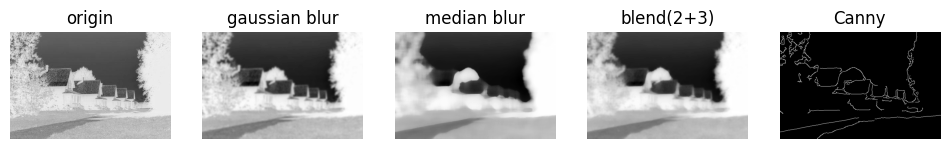

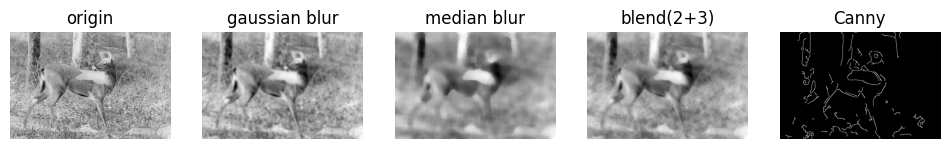

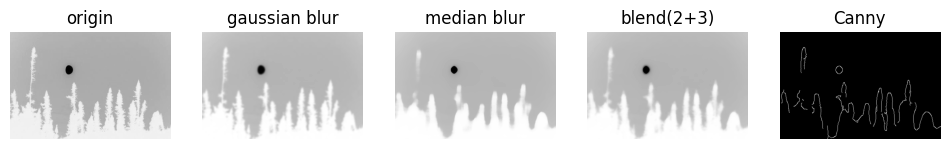

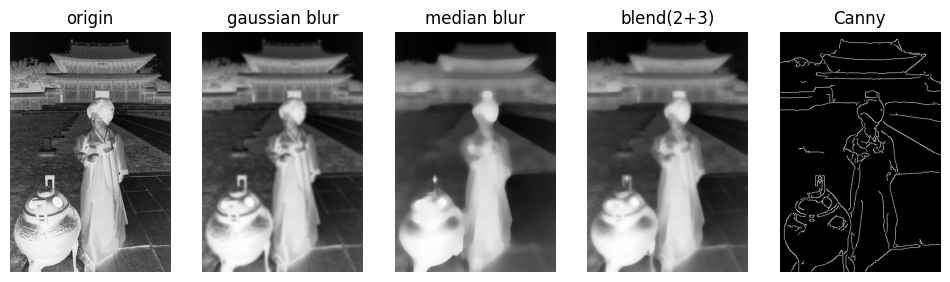

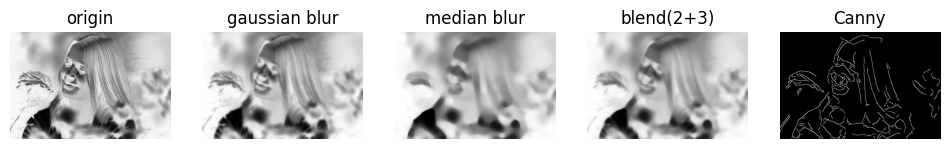

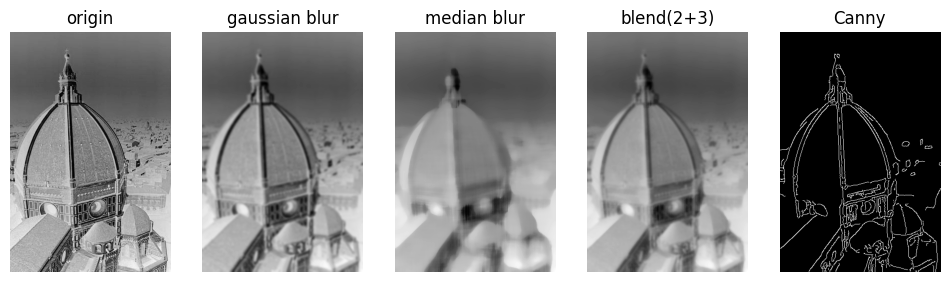

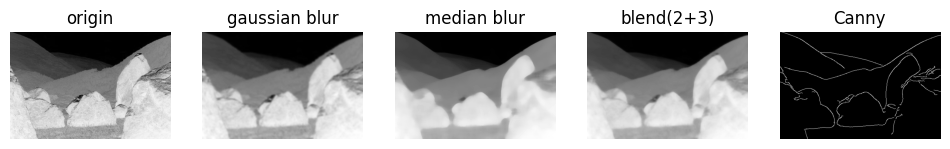

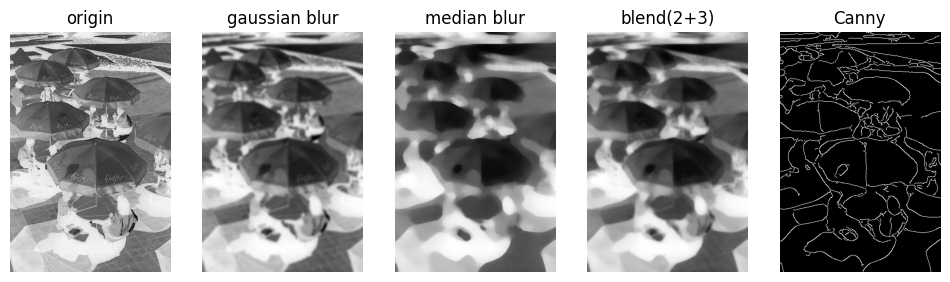

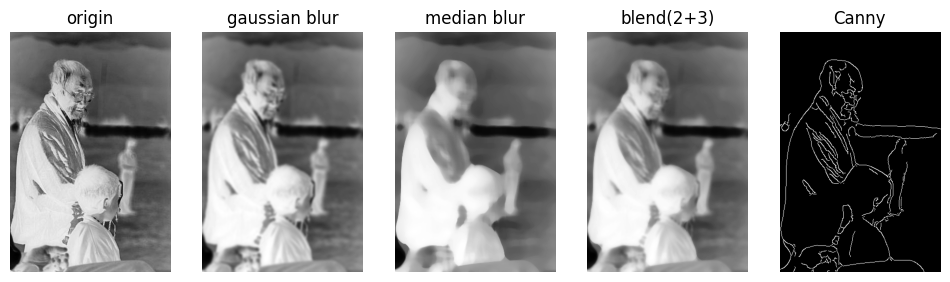

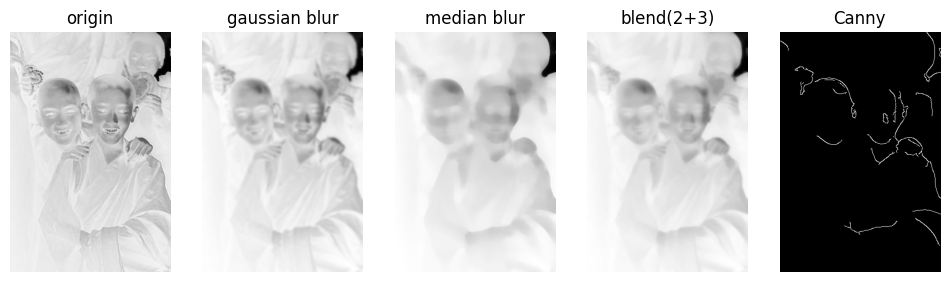

In [ ]:
for selected_sample_name in selected_sample_names:


  image = dataset.read_image(selected_sample_name)
  image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
  # inverse
  img = cv2.bitwise_not(image)
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


  # 블러링
  gblur_img  = cv2.GaussianBlur(img, (11, 11), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(img, ksize=19)

  # median blur + adaptive gaussian
  alpha = 0.5
  blend = cv2.addWeighted(gblur_img, 1-alpha, mblur_img, alpha, 0)


  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(blend, threshold1=6, threshold2=70)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 5, 1)
  plt.title('origin')
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.title('gaussian blur')
  plt.imshow(gblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.title('median blur')
  plt.imshow(mblur_img, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.title('blend(2+3)')
  plt.imshow(blend, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 5, 5)
  plt.title('Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')

  plt.show()



## ⭐️bilateral filter
blend ( mblur + bilater )

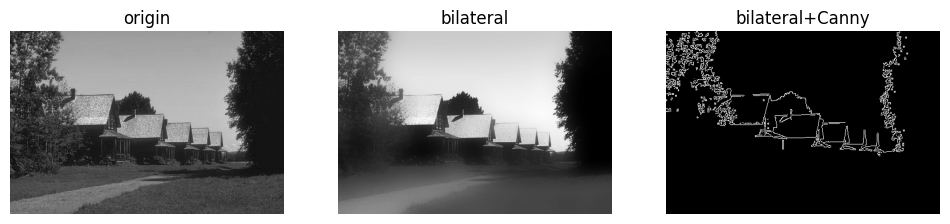

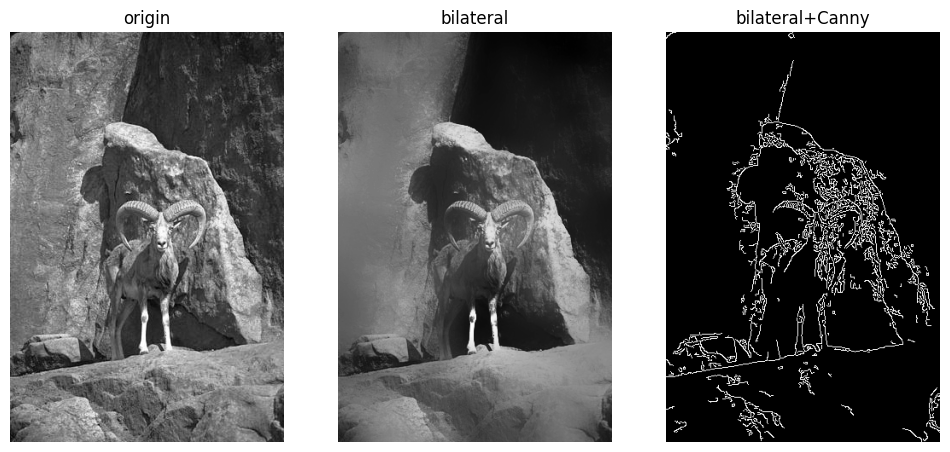

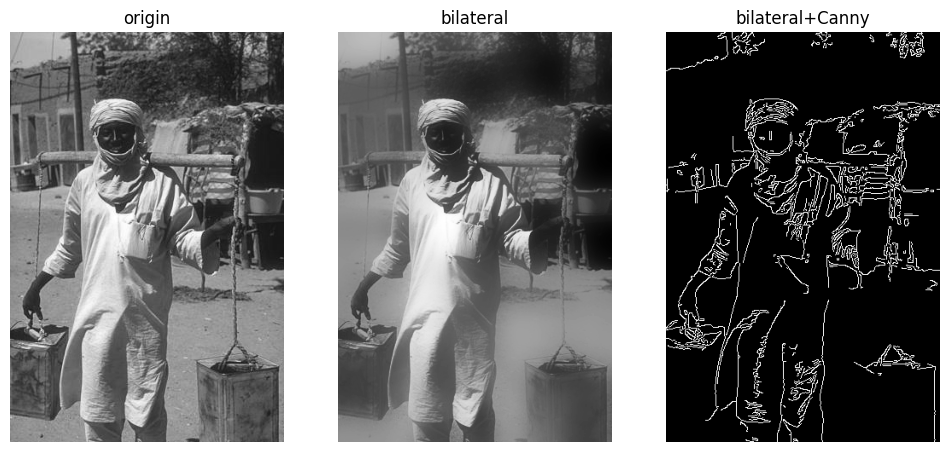

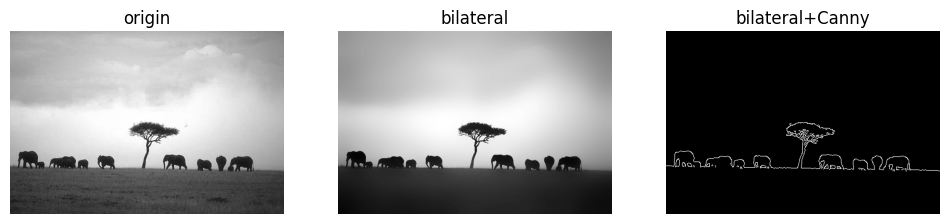

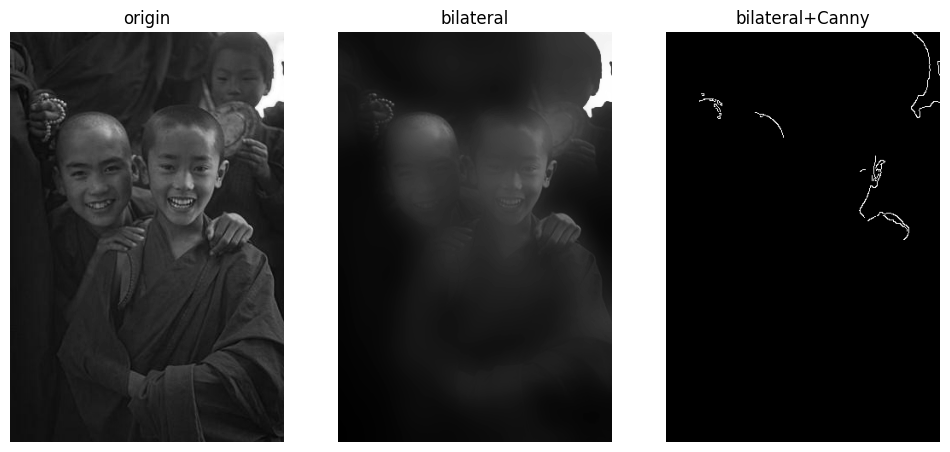

In [37]:
for selected_sample_name in dataset.sample_names:


  image = dataset.read_image(selected_sample_name)
  image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
  image = np.array(image)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # 블러링
  #gblur_img  = cv2.GaussianBlur(image, (11, 11), sigmaX = 0, sigmaY = 0)
  mblur_img  = cv2.medianBlur(image, ksize=33)

  # bilateral
  bi = cv2.bilateralFilter(image, -1, 50, 20)


  # median blur + adaptive gaussian
  alpha = 0.6
  blend = cv2.addWeighted(bi, 1-alpha, mblur_img, alpha, 0)

  # Apply Canny Edge Detection
  canny_edge = cv2.Canny(bi, threshold1=70, threshold2=150)


  # Display the original and adaptive thresholded images
  plt.figure(figsize=(12, 9))
  plt.subplot(1, 3, 1)
  plt.title('origin')
  plt.imshow(image, cmap='gray')
  plt.axis('off')

  # plt.subplot(1, 5, 4)
  # plt.title('bilateral')
  # plt.imshow(bi, cmap='gray')
  # plt.axis('off')

  # plt.subplot(1, 5, 3)
  # plt.title('median blur')
  # plt.imshow(mblur_img, cmap='gray')
  # plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.title('bilateral')
  plt.imshow(bi, cmap='gray')
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.title('bilateral+Canny')
  plt.imshow(canny_edge, cmap='gray')
  plt.axis('off')

  plt.show()

